In [1]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import torchvision.transforms as transforms

from util.util import tensor2im as tensor2img
from models.networks import ResnetGenerator, NLayerDiscriminator

%matplotlib inline
%config InlineBackend.figure_format='retina'

device = torch.device("cuda")

def plot_single_image(image, grid=0, call=False):
    plt.grid(grid)
    plt.imshow(image)
    if not call:
        plt.show()

def plot_multi_images(*images, grid=0):
    n = len(images)
    assert n, "Func needs at least 2 image as param!"
    row_colum = 100 + n * 10
    plt.figure(figsize=(5*n, 8),dpi=60)
    for i, image in enumerate(images):
        plt.subplot(row_colum + i + 1)
        plot_single_image(image, grid=grid, call=True)
    plt.show()

def plot_single_heatmap(array, cmap='viridis', title=None, dpi=60):
    plt.figure(figsize=(5, 5), dpi=dpi)
    if title:
        plt.title(title)
    if isinstance(array, torch.Tensor):
        array = array.cpu().numpy()
    sns.heatmap(array, square=True, cmap=cmap)

def plot_multi_heatmap(*arrays, cmap='viridis', title=None, row=None, col=None):
    n = len(arrays)
    if row is not None:
        col = int(np.ceil(n / row))
    else:
        if col is not None:
            row = int(np.ceil(n / col))
        else:
            row = int(np.sqrt(n))
            col = int(np.ceil(n / row))

    fig, ax = plt.subplots(row, col, figsize=(6*col, 4*row), dpi = 60)
    if title is not None: fig.suptitle(title)

    for i, array in enumerate(arrays):
        if isinstance(array, torch.Tensor):
            array = array.cpu().numpy()
        r = i // col
        c = i % col
        axi = ax[r, c] if row > 1 else ax[c]
        sns.heatmap(array, square=True, cmap=cmap, ax=axi)
    plt.show()


# 这部分是直接从源代码中抄的img2tensor 和 tensor2img
transform_list = [transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]
tf = transforms.Compose(transform_list)

def img2tensor(image):
    image = np.ascontiguousarray(image)
    return tf(image).unsqueeze(0).to(device)

In [2]:
from models import create_model

class Args:
    def __init__(self):
        # --name horse2zebra_pretrained --model test --no_dropout
        self.name = "bh_p"
        self.model = "test"
        self.no_dropout = True
        self.isTrain = False
        self.gpu_ids = [0]
        self.checkpoints_dir = './checkpoints'
        self.preprocess = "none"
        self.model_suffix = ""
        self.input_nc = 3
        self.output_nc = 3
        self.ngf = 64
        self.netG = "resnet_9blocks"
        self.netD = "basic"
        self.norm = "instance"
        self.init_type = "normal"
        self.init_gain = 0.02
        self.dataroot  = "datasets/bh/testA"
        self.eval = True
        self.load_iter = 0
        self.epoch = 'latest'
        self.verbose = False

opt = Args()

model = create_model(opt)
model.setup(opt)

initialize network with normal
model [TestModel] was created
loading the model from ./checkpoints/bh_p/latest_net_G.pth
---------- Networks initialized -------------
[Network G] Total number of parameters : 11.378 M
-----------------------------------------------


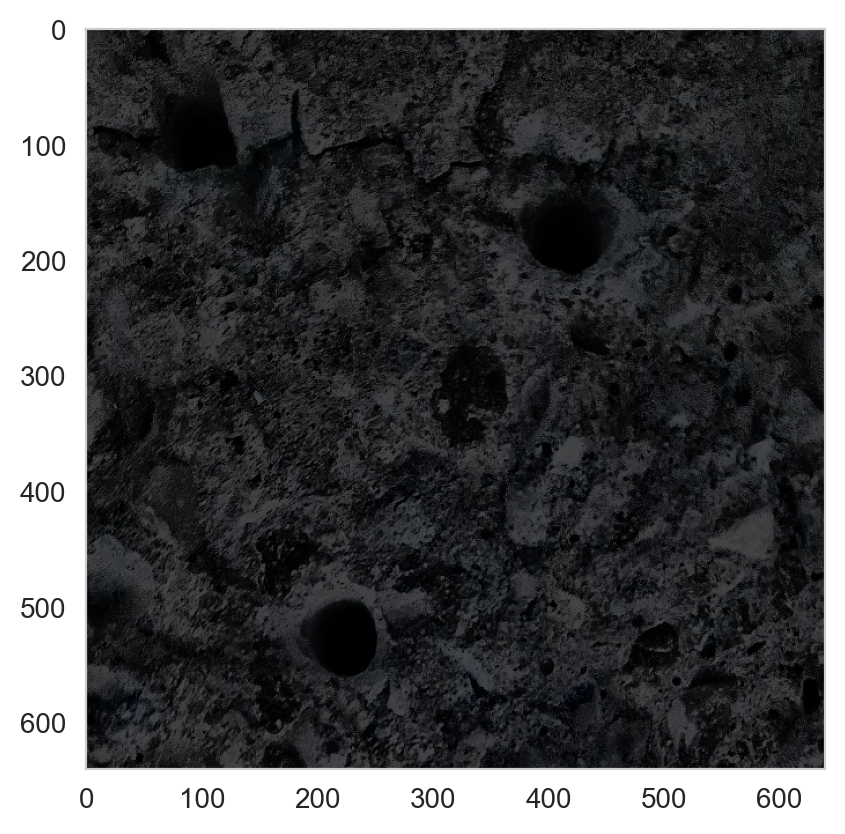

In [3]:
img = cv2.imread("../bh-recrop/datasets_out/trainA/bh_2_r0.jpg")
plot_single_image(img)

In [4]:
model = model.netG.module
# model.detach_layer = [3, 6, 9, 18, 21, 24]

# 测试多Batch

In [5]:
img1 = img2tensor(img)
inputs = torch.concat((img1, img1), 0)
inputs.shape

torch.Size([2, 3, 640, 640])

In [6]:
out = model(inputs)

In [7]:
out.shape

torch.Size([2, 3, 640, 640])

In [8]:
out_img1 = tensor2img(out[0].unsqueeze(0))
out_img2 = tensor2img(out[1].unsqueeze(0))

In [9]:
model.features[0].shape

torch.Size([2, 64, 640, 640])

In [10]:
# torch.jit.save(torch.jit.trace(model, (img1)), "1.pt")

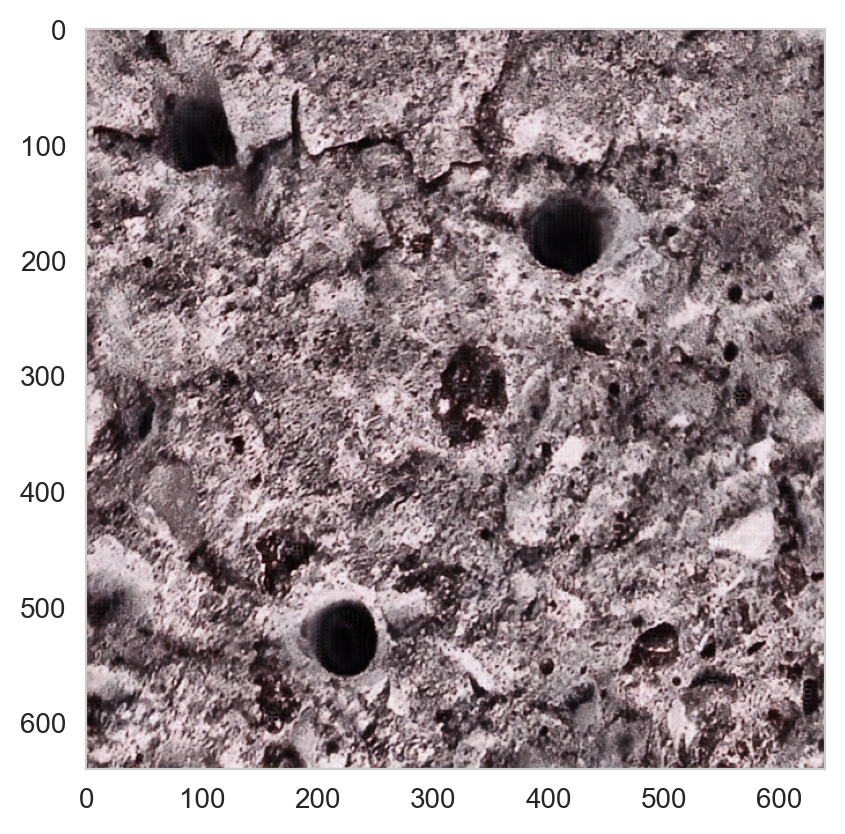

In [11]:
del model.features
out = model(img1)
out_img = tensor2img(out)
plot_single_image(out_img)

torch.Size([1, 64, 640, 640])


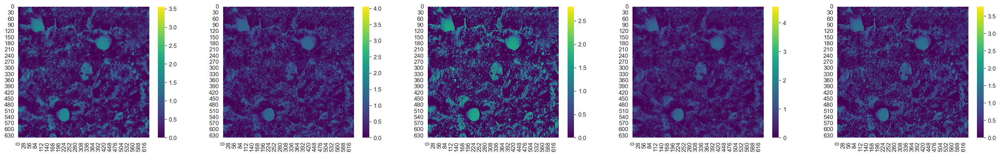

torch.Size([1, 128, 320, 320])


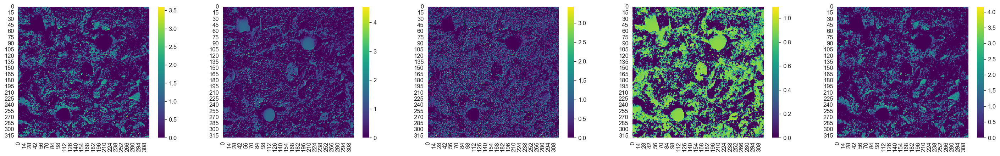

torch.Size([1, 256, 160, 160])


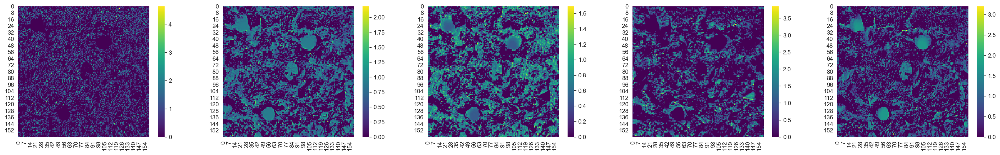

torch.Size([1, 256, 160, 160])


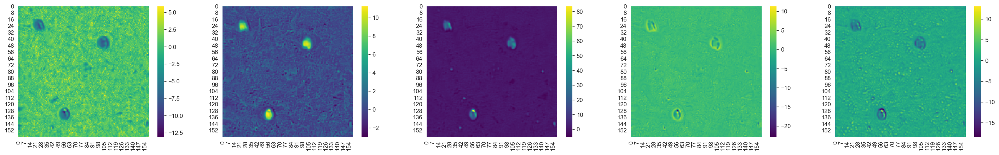

torch.Size([1, 128, 320, 320])


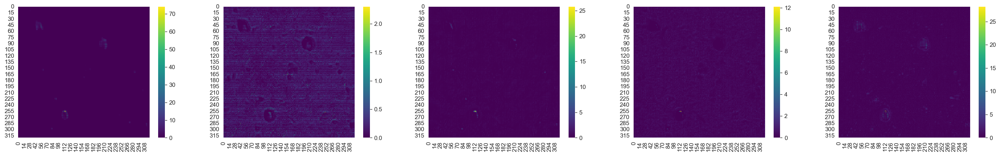

torch.Size([1, 64, 640, 640])


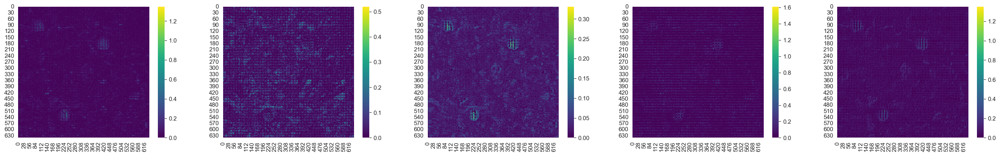

In [12]:
for feature in model.get_features():
    print(feature.shape)
    col = min(5, feature.shape[1])
    plot_multi_heatmap(*(feature[0,i] for i in range(col)), col=col)

In [13]:
model.clear_features()

In [14]:
torch.save(model.state_dict(), "state_dict.pth")

In [15]:
del model

In [23]:
from models.networks import ResnetGenerator
import torch.nn as nn
model = ResnetGenerator(3,3,64,nn.InstanceNorm2d, n_blocks=9).to(device)

In [24]:
model.load_state_dict(torch.load("state_dict.pth"))

<All keys matched successfully>

In [25]:
model.detach_layer

(3, 6, 9, 18, 21, 24)

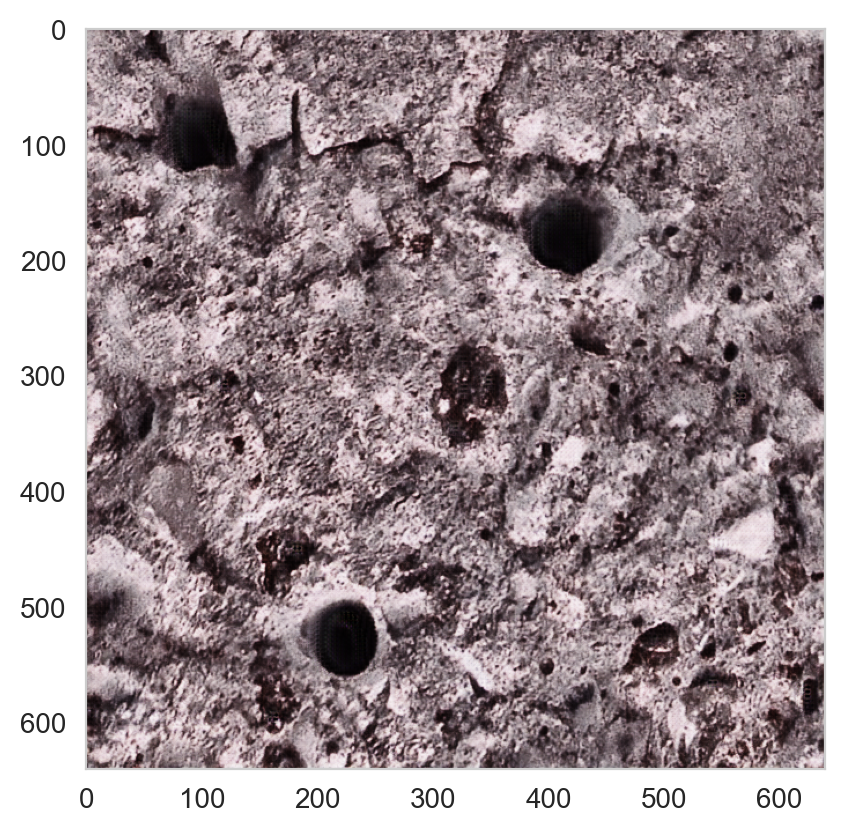

In [26]:
out = model(img1)
out_img = tensor2img(out)
plot_single_image(out_img)

torch.Size([1, 64, 640, 640])


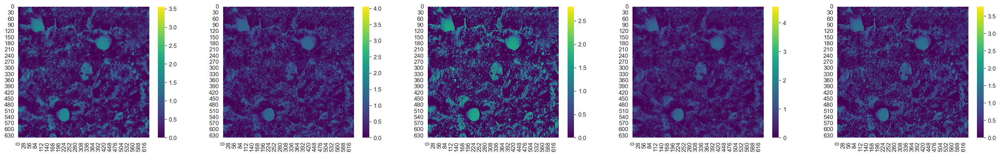

torch.Size([1, 128, 320, 320])


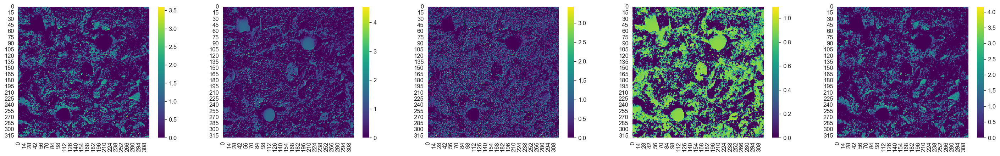

torch.Size([1, 256, 160, 160])


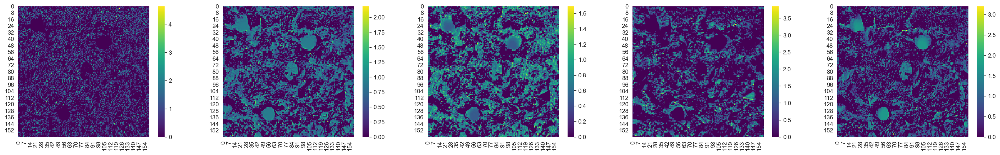

torch.Size([1, 256, 160, 160])


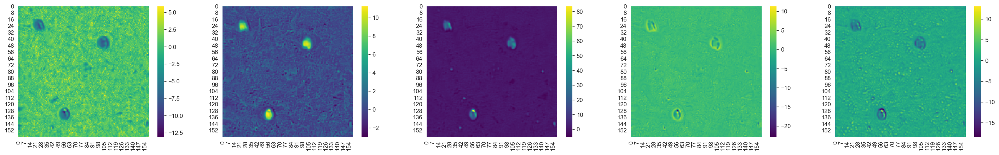

torch.Size([1, 128, 320, 320])


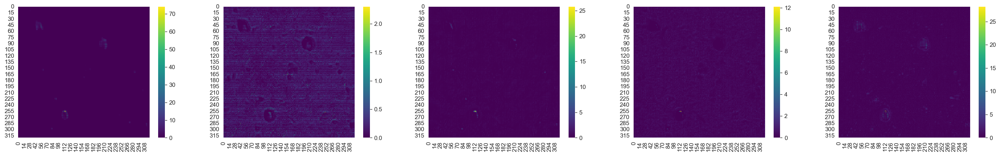

torch.Size([1, 64, 640, 640])


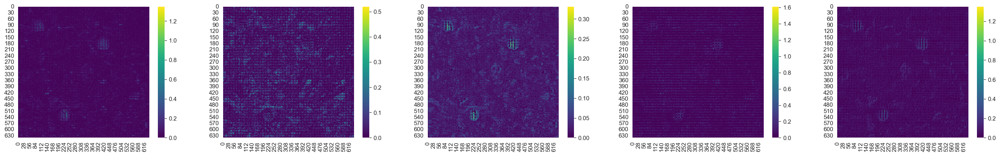

In [27]:
for feature in model.get_features():
    print(feature.shape)
    col = min(5, feature.shape[1])
    plot_multi_heatmap(*(feature[0,i] for i in range(col)), col=col)